# Setup

In [1]:
import Pkg; Pkg.activate("..");

In [2]:
using DigitalMusicology
using MusicologyPlots
include("../src/polygrams.jl")

DigitalMusicology.usekern("/home/chfin/Uni/phd/data/csapp/mozart-piano-sonatas/");

# Schemata

In [3]:
fonte = @midi [[0, 6], [1, 4], [10, 4], [11, 3]]
prinner = @midi [[0, 4], [11, 2], [9, 0], [7, 11]]
prinner3 = @midi [[0, 7, 4], [11, 7, 2], [9, 6, 0], [7, 7, 11]]

4-element Array{Array{MidiPitch,1},1}:
 [0, 7, 4] 
 [11, 7, 2]
 [9, 6, 0] 
 [7, 7, 11]

# Finding Schemata

## Mozart Piano Sonata No. 3, 3 (Rondo: Allegro)

In [4]:
rondoid = "sonata03-3"
notes_rondo = getpiece(rondoid, :notes_wholes)
barlen_rondo = Polygrams.piecebarlen(rondoid)

1//1

In [5]:
matches = Polygrams.schemamatches(notes_rondo, [fonte], barlen_rondo, barlen_rondo)
polys_rondo = collect(matches)
length(polys_rondo)

24106

In [6]:
polys_rondo[1]

4-element Array{Array{TimedNote{MidiPitch,Rational{Int64}},1},1}:
 [Note<0//1-1//4>(77), Note<1//4-1//2>(59)] 
 [Note<1//2-1//1>(60), Note<5//8-3//4>(75)] 
 [Note<1//1-5//4>(75), Note<5//4-3//2>(57)] 
 [Note<3//2-2//1>(58), Note<13//8-7//4>(74)]

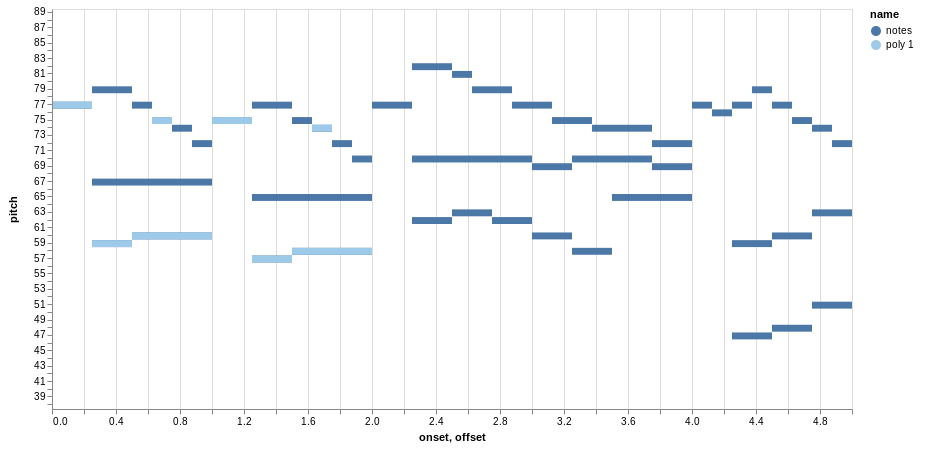

In [7]:
plotpolygrams(notes_rondo, [polys_rondo[1]], start=0, stop=5)

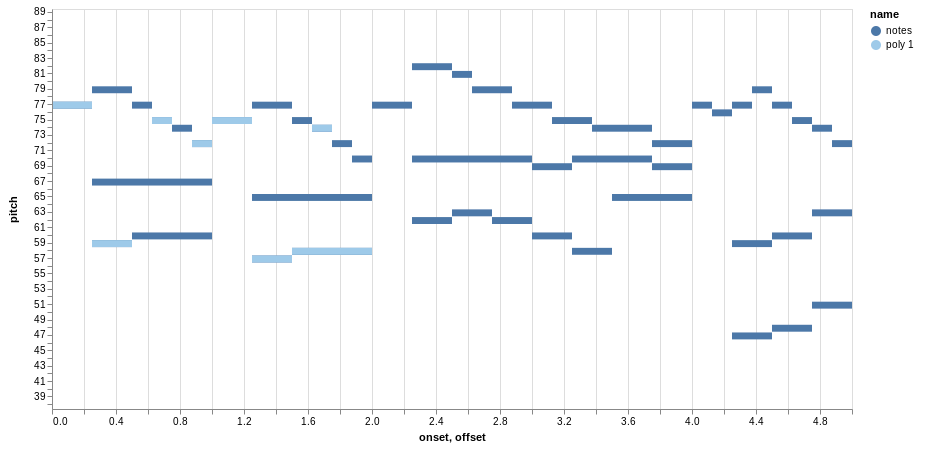

In [8]:
plotpolygrams(notes_rondo, [polys_rondo[2]], start=0, stop=5)

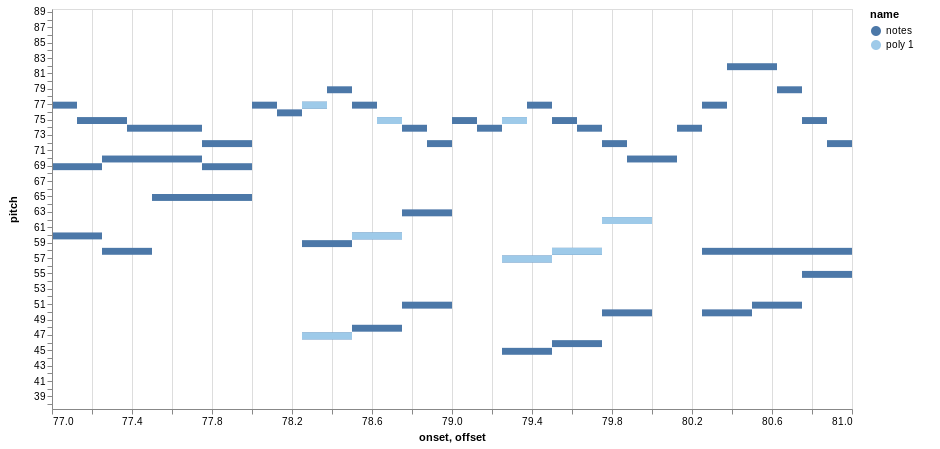

In [9]:
plotpolygrams(notes_rondo, [polys_rondo[12345]], start=77, stop=81)

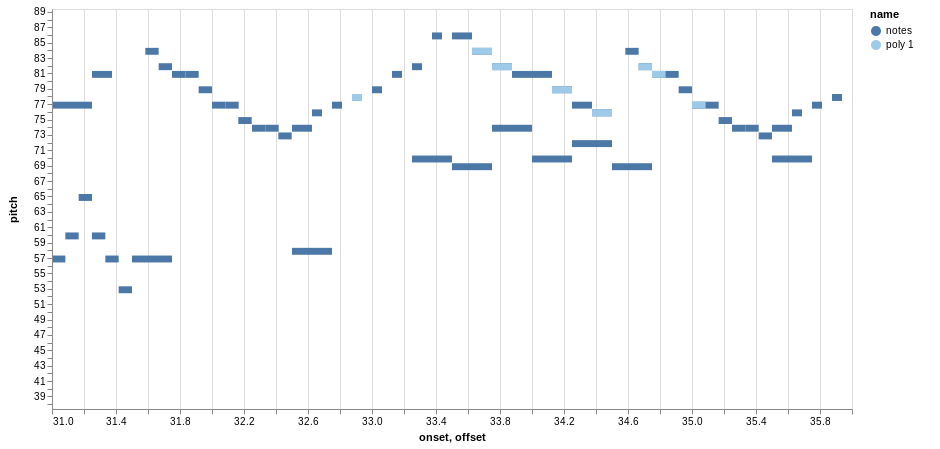

In [10]:
plotpolygrams(notes_rondo, [polys_rondo[5980]], start=31, stop=36)

## Mozart Piano Sonata 16, 1 (Allegro)

In [11]:
allegroid = "sonata15-1"
notes_allegro = getpiece(allegroid, :notes_wholes)
barlen_allegro = Polygrams.piecebarlen(allegroid)

1//1

In [12]:
matches = Polygrams.schemamatches(notes_allegro, [prinner], barlen_allegro, barlen_allegro)
polys_allegro = collect(matches)
length(polys_allegro)

48758

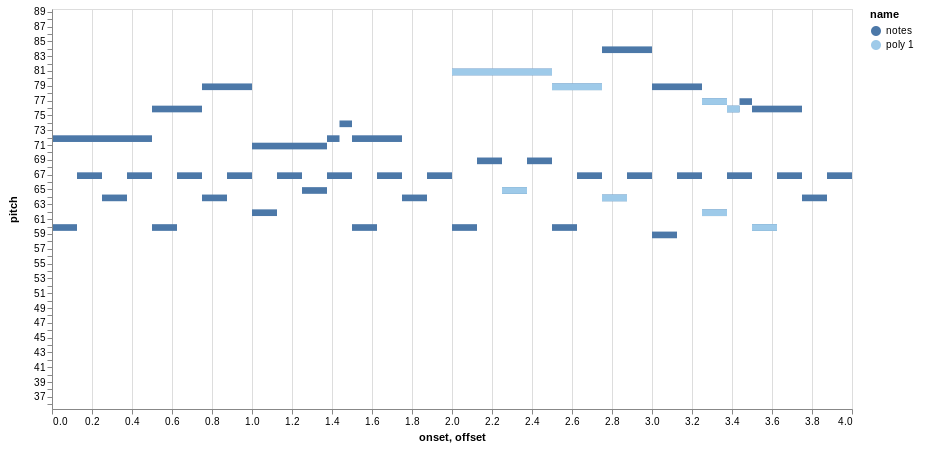

In [13]:
plotpolygrams(notes_allegro, [polys_allegro[1]], start=0, stop=4)

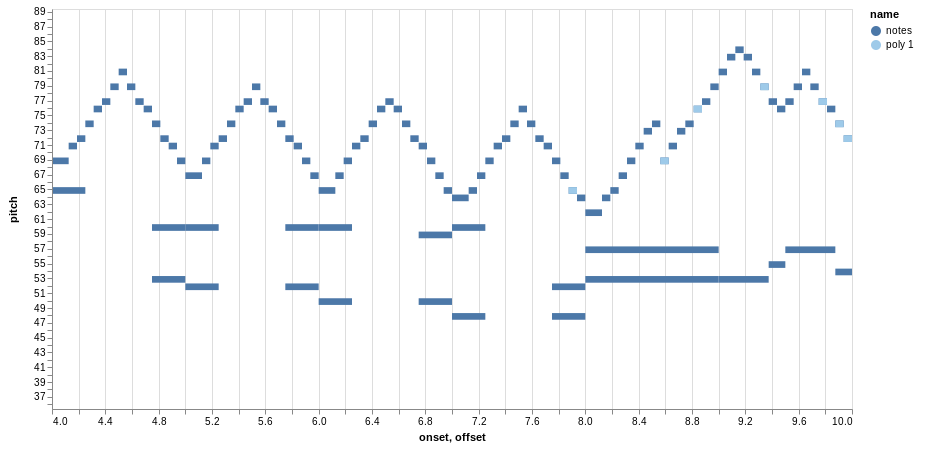

In [14]:
plotpolygrams(notes_allegro, [polys_allegro[12345]], start=4, stop=10)

# Filtering Matches

In [15]:
# don't look at this!!!
# warning: magic numbers!
polyweight(poly, beatfactor) = (beatfactor * Polygrams.totalduration(poly)
    - 1//12 * Polygrams.voicedist(poly)
    - beatfactor * 2Polygrams.instageskip(poly))

polyweight (generic function with 1 method)

## Sonata 3, 3

In [16]:
tsrondo = getpiece(rondoid, :timesigs)
beatfactor_rondo = denominator(content(tsrondo[1]))
weight_rondo(poly) = polyweight(poly, beatfactor_rondo)
weighted_rondo = Polygrams.sortbyweight(polys_rondo, weight_rondo)
sorted_rondo = map(first, weighted_rondo);

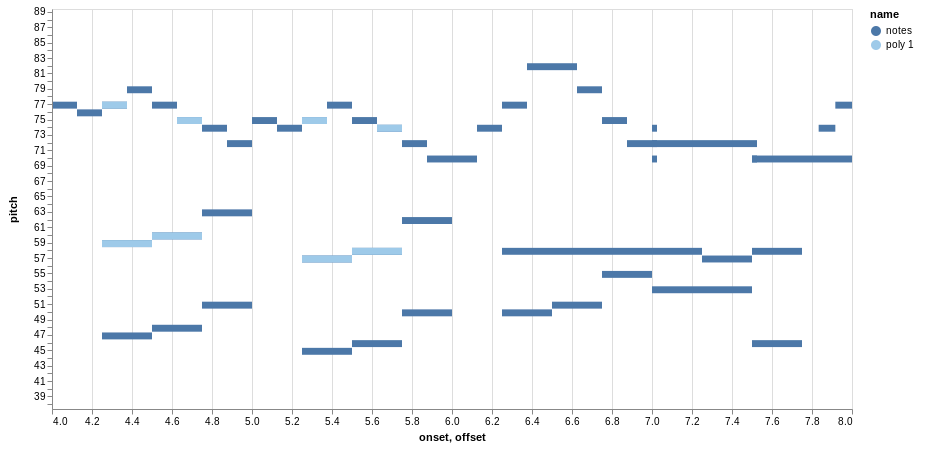

In [17]:
plotpolygrams(notes_rondo, [sorted_rondo[1]], start=4, stop=8) # look at 2 and 3 as well

In [18]:
best_rondo = Polygrams.bestmatches(!Polygrams.polyssharetime, sorted_rondo);
length(best_rondo)

13

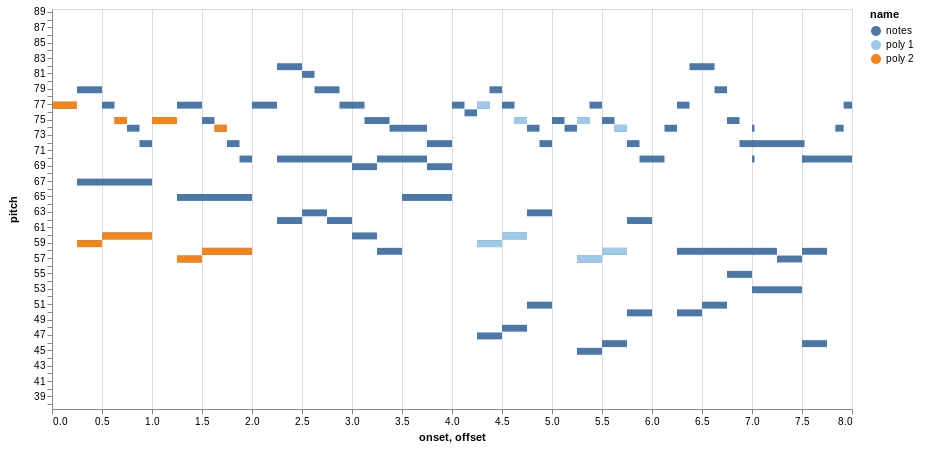

In [19]:
plotpolygrams(notes_rondo, best_rondo[[1,6]], start=0, stop=8) # also 2,7; 3,8; 4,9

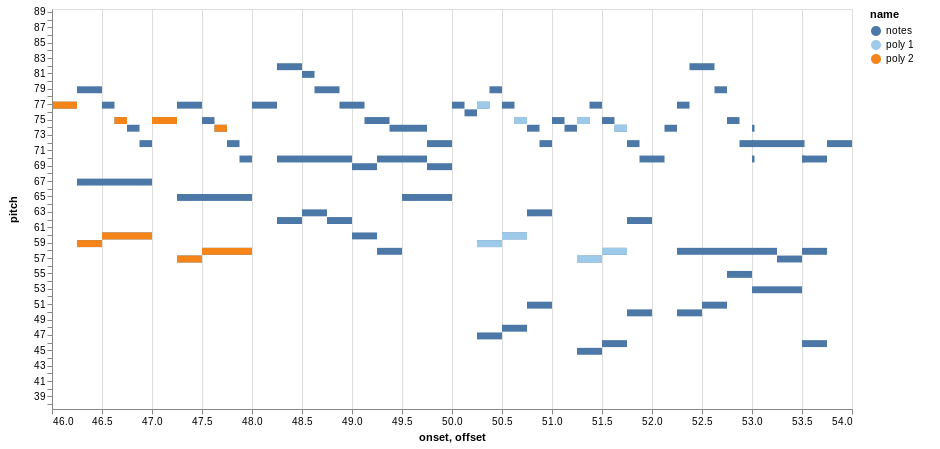

In [20]:
plotpolygrams(notes_rondo, best_rondo[[2,7]], start=46, stop=54)

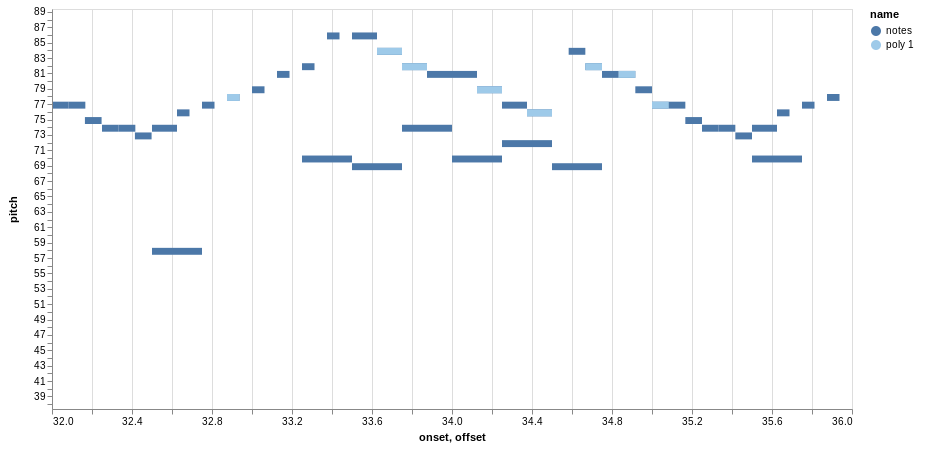

In [21]:
plotpolygrams(notes_rondo, [best_rondo[13]], start=32, stop=36)

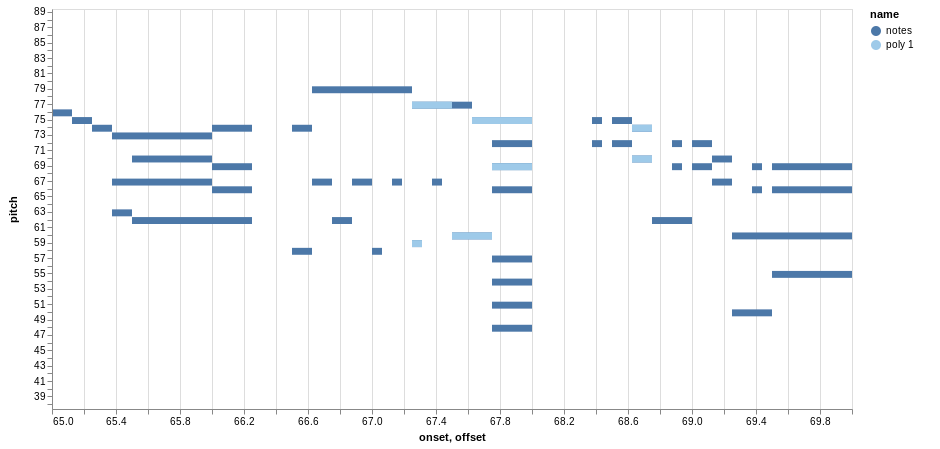

In [22]:
plotpolygrams(notes_rondo, [best_rondo[5]], start=65, stop=70)

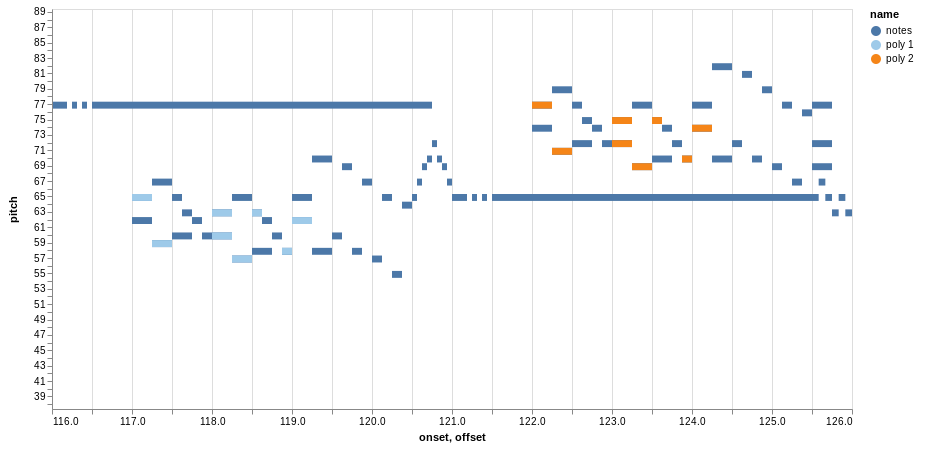

In [23]:
plotpolygrams(notes_rondo, best_rondo[[10,11]], start=116, stop=126)

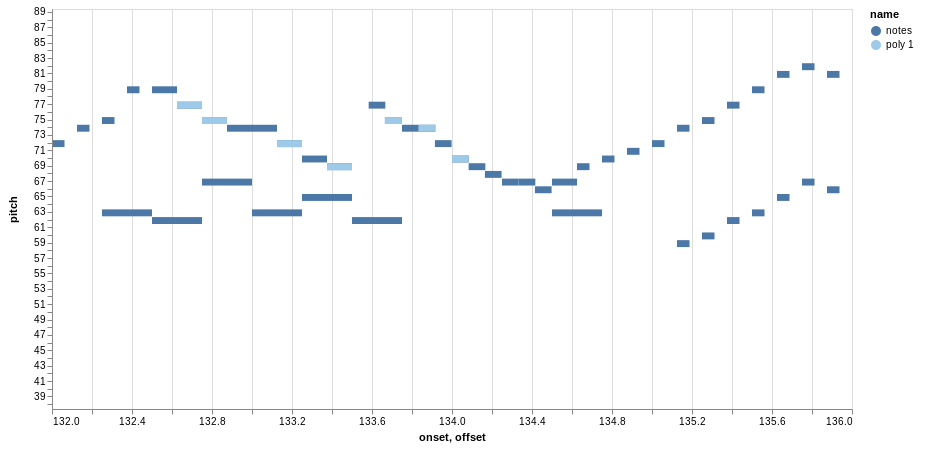

In [24]:
plotpolygrams(notes_rondo, [best_rondo[12]], start=132, stop=136)

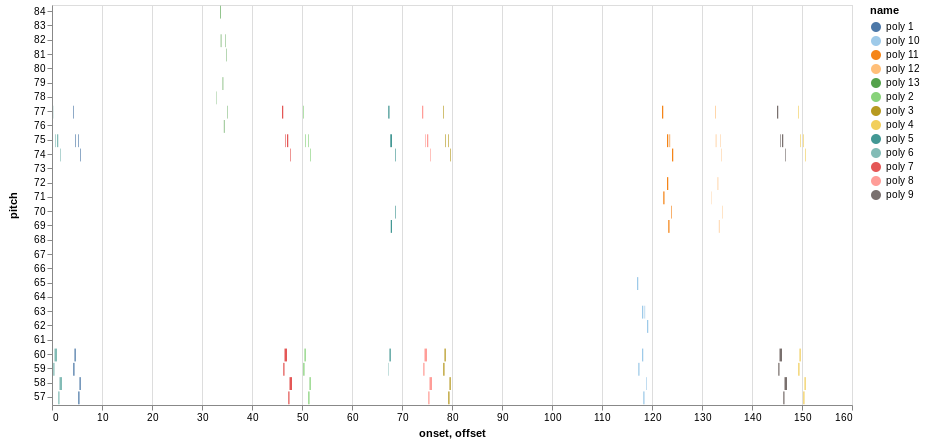

In [25]:
plotpolygrams([], best_rondo)

## Sonata 16, 1

In [26]:
tsallegro = getpiece(allegroid, :timesigs)
beatfactor_allegro = denominator(content(tsallegro[1]))
weight_allegro(poly) = polyweight(poly, beatfactor_allegro)
weighted_allegro = Polygrams.sortbyweight(polys_allegro, weight_allegro)
sorted_allegro = map(first, weighted_allegro);

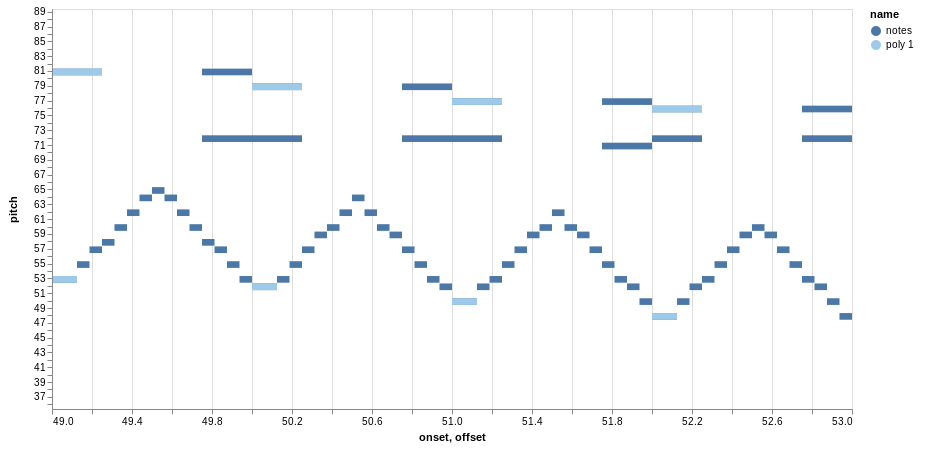

In [27]:
plotpolygrams(notes_allegro, [sorted_allegro[1]], start=49, stop=53)

In [28]:
best_allegro = Polygrams.bestmatches(!Polygrams.polyssharetime, sorted_allegro);
length(best_allegro)

13

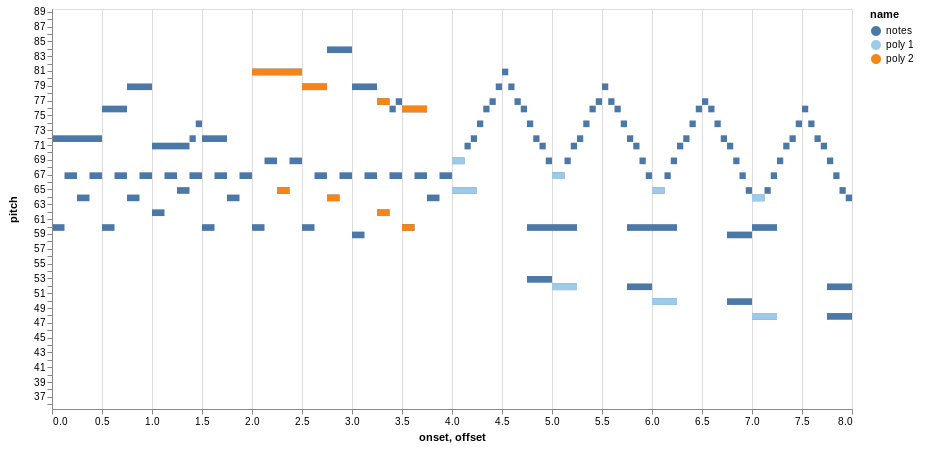

In [29]:
plotpolygrams(notes_allegro, best_allegro[[2,5]], start=0, stop=8)

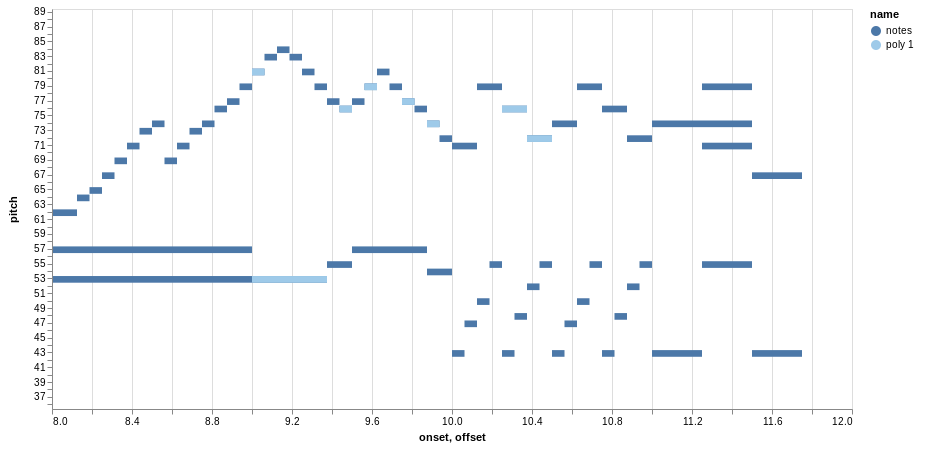

In [30]:
plotpolygrams(notes_allegro, [best_allegro[11]], start=8, stop=12)

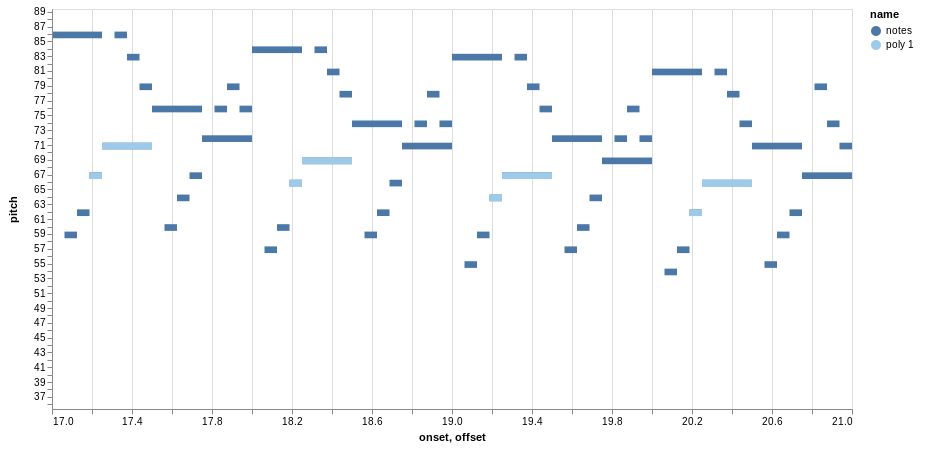

In [31]:
plotpolygrams(notes_allegro, [best_allegro[4]], start=17, stop=21)

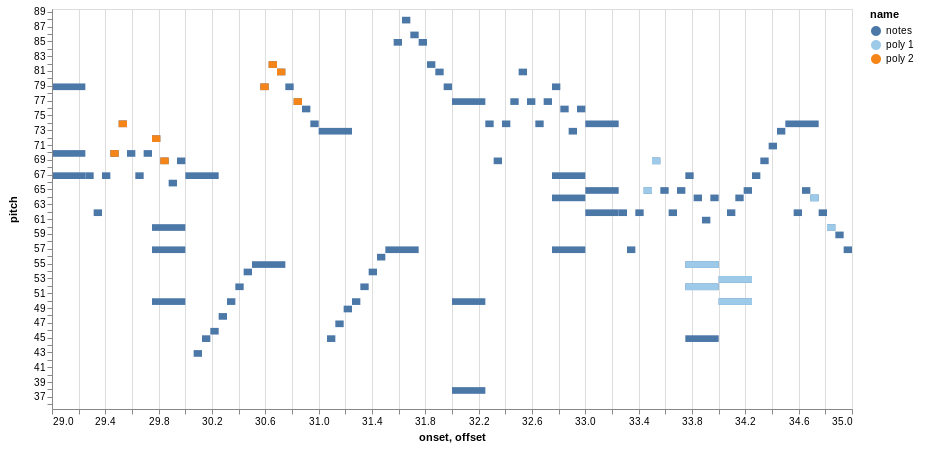

In [32]:
plotpolygrams(notes_allegro, best_allegro[[10,12]], start=29, stop=35)

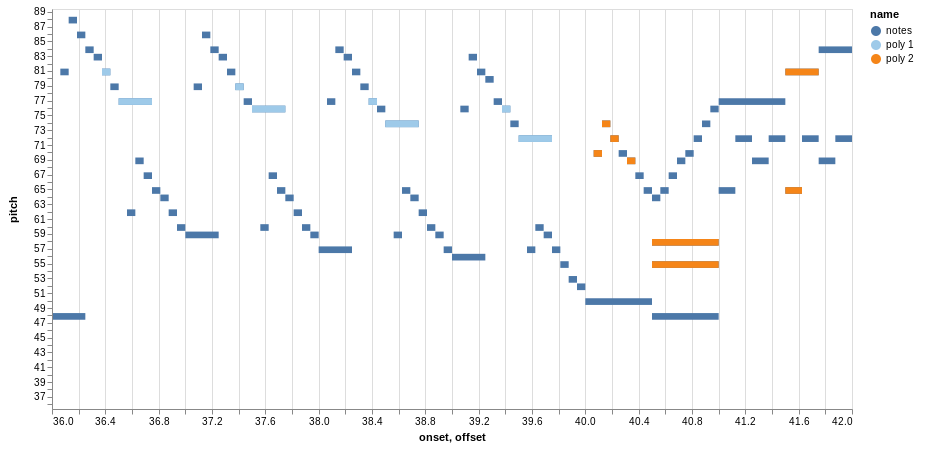

In [33]:
plotpolygrams(notes_allegro, best_allegro[[8,9]], start=36, stop=42)

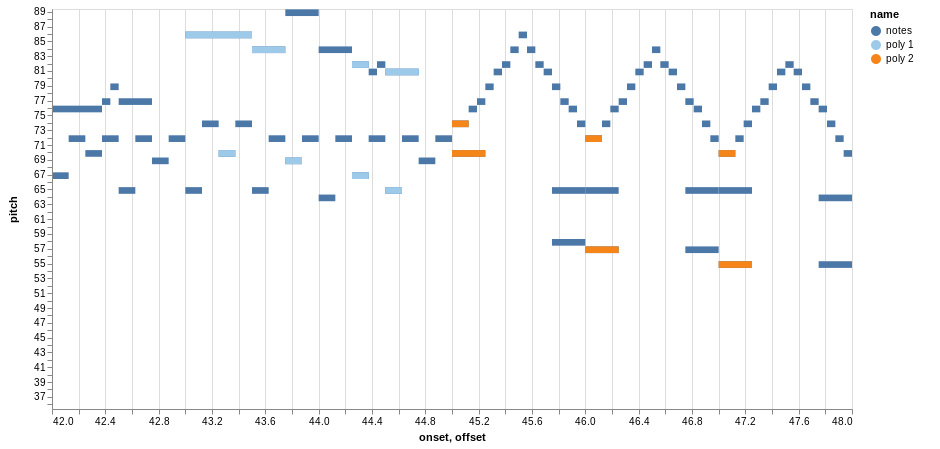

In [34]:
plotpolygrams(notes_allegro, best_allegro[[6,3]], start=42, stop=48)

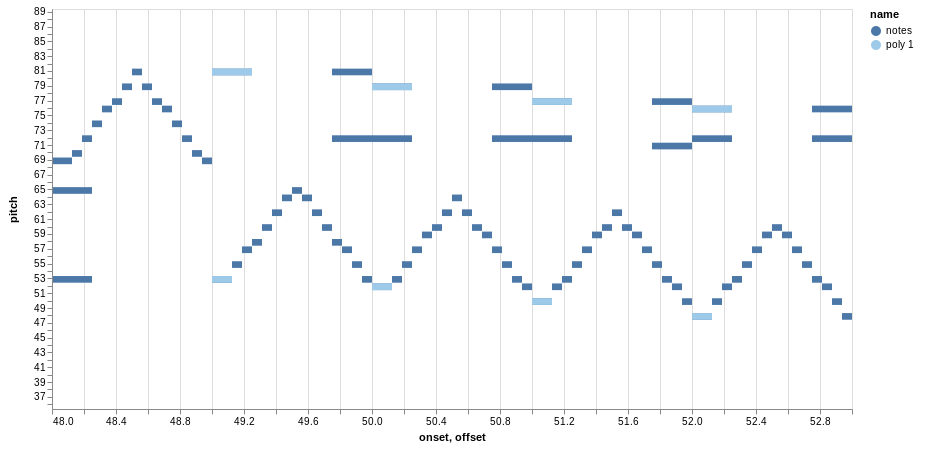

In [35]:
plotpolygrams(notes_allegro, [best_allegro[1]], start=48, stop=53)

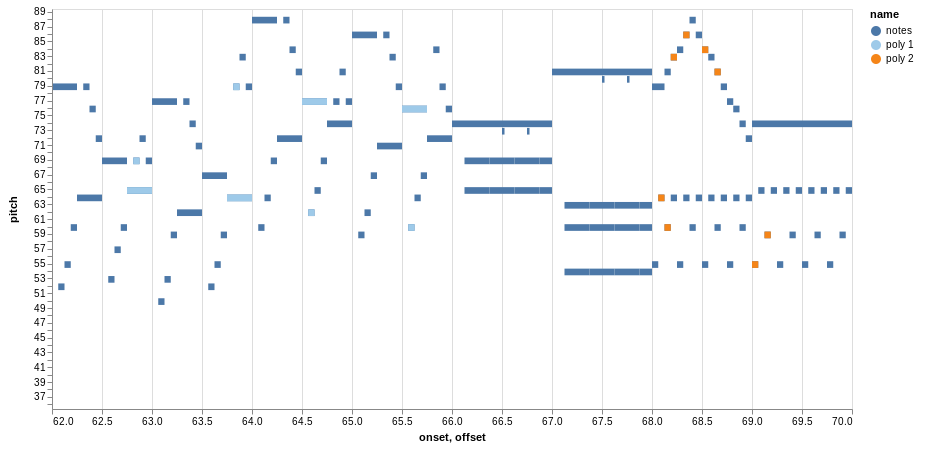

In [36]:
plotpolygrams(notes_allegro, best_allegro[[7,13]], start=62, stop=70)

In [ ]:
plotpolygrams([], best_allegro)